In [1]:
import pandas as pd
import numpy as np

import os
import sys

# librosa is a Python library for analyzing audio and music. It can be used to extract the data from the audio files we will see it later.
import librosa
#import librosa.display # Aparentemente esto bugea todo segun un git issue 
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# to play the audio files
from IPython.display import Audio
from pydub import AudioSegment

import keras
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from keras.utils import np_utils, to_categorical
from keras.callbacks import ModelCheckpoint

import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning) 

In [2]:
DURATION = 2.5
base_url = "C:/Users/emanu/Documents/Data Science/Proyectos/Proyecto Master/Datasets"

# Paths for data.
talkbank = f"{base_url}/TALKBANK"

In [3]:
def create_waveplot(data, sr):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio', size=15)
    #librosa.display.waveplot(data, sr=sr)
    # por temas de compatibilidad
    librosa.display.waveshow(data, sr=sr)
    plt.show()

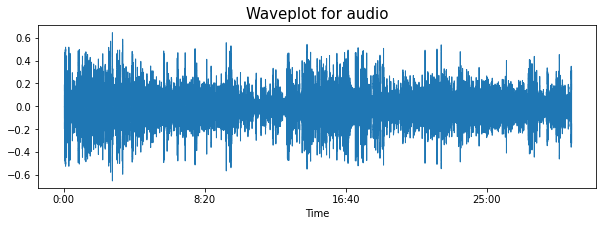

In [4]:
path = talkbank + '/4175.mp3'
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate)
Audio(path)

In [5]:
# Carga audio para trabajar por segmento
segment = AudioSegment.from_file('4175.mp3', 'mp3')

## Data Augmentation

In [6]:
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    #     return librosa.effects.time_stretch(data, rate)
    # Compatibility issues
    return librosa.effects.time_stretch(data, rate = rate)

def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sr = sampling_rate, n_steps = pitch_factor)

## Feature Extraction

In [7]:
def extract_features(data, sample_rate):
    # ZCR
    result = np.array([])
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result=np.hstack((result, zcr)) # stacking horizontally

    # Chroma_stft
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft)) # stacking horizontally

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mfcc)) # stacking horizontally

    # Root Mean Square Value
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms)) # stacking horizontally

    # MelSpectogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel)) # stacking horizontally
    
    return result

In [8]:
def get_features(path, o):
    # duration and offset are used to take care of the no audio in start and the ending of each audio files as seen above.
    data, sample_rate = librosa.load(path, duration= DURATION, offset= 1000)

    # without augmentation
    res1 = extract_features(data, sample_rate)
    result = np.array(res1)
    
    return result

In [10]:
# Loop para obtener todos los features de talkbank
X, Y, Z = [], [], []
for i in range(round(librosa.get_duration(path = path)) * 2 - 3):
    
    feature = get_features(path, i / 2)
    
    X.append(feature)
    
    seconds = (i/2) * 1000
    
    Z.append(f'{i/2}-{i/2+3}')
    Y.append(segment[seconds:seconds + DURATION*1000])
    
    # Solo me quedo con las priemras 100 interacciones
    if i == 100:
        break

In [11]:
Features = pd.DataFrame(X)
Features.head()

,0,1,2,3,4,5,6,7,8,9,...,152,153,154,155,156,157,158,159,160,161
0,0.086688,0.450285,0.446078,0.558428,0.610943,0.584282,0.537496,0.547219,0.607105,0.665769,...,5.079661e-08,4.683882e-08,4.325887e-08,4.019463e-08,3.757134e-08,3.540311e-08,3.370263e-08,3.240714e-08,3.152046e-08,3.097835e-08
1,0.086688,0.450285,0.446078,0.558428,0.610943,0.584282,0.537496,0.547219,0.607105,0.665769,...,5.079661e-08,4.683882e-08,4.325887e-08,4.019463e-08,3.757134e-08,3.540311e-08,3.370263e-08,3.240714e-08,3.152046e-08,3.097835e-08
2,0.086688,0.450285,0.446078,0.558428,0.610943,0.584282,0.537496,0.547219,0.607105,0.665769,...,5.079661e-08,4.683882e-08,4.325887e-08,4.019463e-08,3.757134e-08,3.540311e-08,3.370263e-08,3.240714e-08,3.152046e-08,3.097835e-08
3,0.086688,0.450285,0.446078,0.558428,0.610943,0.584282,0.537496,0.547219,0.607105,0.665769,...,5.079661e-08,4.683882e-08,4.325887e-08,4.019463e-08,3.757134e-08,3.540311e-08,3.370263e-08,3.240714e-08,3.152046e-08,3.097835e-08
4,0.086688,0.450285,0.446078,0.558428,0.610943,0.584282,0.537496,0.547219,0.607105,0.665769,...,5.079661e-08,4.683882e-08,4.325887e-08,4.019463e-08,3.757134e-08,3.540311e-08,3.370263e-08,3.240714e-08,3.152046e-08,3.097835e-08


## Data Preparation

In [12]:
X = Features.iloc[: ,:].values

In [13]:
# Leer scaler
from joblib import dump, load

scaler = load('std_scaler.bin')
encoder = load('encoder.bin')

In [14]:
x_test = scaler.transform(X)

In [15]:
x_test = np.expand_dims(x_test, axis=2)

## Predictions

In [16]:
model = keras.models.load_model('BASE_MODEL_19_05_2023.h5')

In [17]:
# predicting on test data.
pred_test = model.predict(x_test)
y_pred = encoder.inverse_transform(pred_test)

4/4 [==============================] - 0s 6ms/step


In [18]:
print(y_pred[70])
print(Z[70])
Y[70]

['happy']
35.0-38.0
